# 0. Imports and setup

In [2]:
%matplotlib inline
import numpy as np
from numpy import genfromtxt

import torch
import torch.nn as nn
import torch.nn.functional as F
import torchvision
import matplotlib
import matplotlib.pyplot as plt
from torchsummary import summary
from tqdm.notebook import tqdm
from datetime import datetime
import scipy.stats


from PIL import Image
import glob

# MATLAB (Octave) setup
# Add m functions to the path

from oct2py import octave
octave.addpath('../MMA_SurrOpt_2023/')

# convert the .m file into a csv file


# Template for running .m file
# octave.eval("""function [a, b] = toto(c);
#     a = c;
#     b = c + 1;
# end""")
# a,b = octave.eval("toto(3, nout =2)")
# a,b = octave.toto(3, nout = 2)
# print(a,b)


'.;C:\\Users\\pitipatw\\miniconda3\\envs\\myvae\\Lib\\site-packages\\oct2py;C:\\Users\\pitipatw\\miniconda3\\envs\\myvae\\Lib\\site-packages\\octave_kernel;C:\\Program Files\\GNU Octave\\Octave-8.4.0\\mingw64\\lib\\octave\\8.4.0\\site\\oct\\x86_64-w64-mingw32;C:\\Program Files\\GNU Octave\\Octave-8.4.0\\mingw64\\lib\\octave\\site\\oct\\api-v58\\x86_64-w64-mingw32;C:\\Program Files\\GNU Octave\\Octave-8.4.0\\mingw64\\lib\\octave\\site\\oct\\x86_64-w64-mingw32;C:\\Program Files\\GNU Octave\\Octave-8.4.0\\mingw64\\share\\octave\\8.4.0\\site\\m;C:\\Program Files\\GNU Octave\\Octave-8.4.0\\mingw64\\share\\octave\\site\\api-v58\\m;C:\\Program Files\\GNU Octave\\Octave-8.4.0\\mingw64\\share\\octave\\site\\m;C:\\Program Files\\GNU Octave\\Octave-8.4.0\\mingw64\\share\\octave\\site\\m\\startup;C:\\Program Files\\GNU Octave\\Octave-8.4.0\\mingw64\\lib\\octave\\8.4.0\\oct\\x86_64-w64-mingw32;C:\\Program Files\\GNU Octave\\Octave-8.4.0\\mingw64\\share\\octave\\8.4.0\\m;C:\\Program Files\\GNU Octav

In [3]:
#Turn .mat to .csv
# import scipy.io
# mat = scipy.io.loadmat('data2000/log.mat')
# print(mat['log'])
# print(len(mat['log'][0]))
# np.savetxt( "data2000/log.csv", mat['log'][0], delimiter=',')


## 0.1 Test torch 🔋

In [4]:
import torch
x = torch.rand(5, 3)
print(x)

tensor([[0.4847, 0.2981, 0.4176],
        [0.9432, 0.5539, 0.1817],
        [0.7677, 0.8777, 0.3618],
        [0.7969, 0.7075, 0.5677],
        [0.2410, 0.3063, 0.8709]])


## 1. Load data

In [5]:
# Initialize the container
design_vectors = [] # 
blfs = []

# path to the dataset (png files)
# path = 'E:\dev\Fall23Project\dataset/*.png'
# path_dummy = 'E:\dev\Fall23Project\dataset_dummy/*.png'
# path_buckling = "E:\dev\Fall23Project\dataset\Images/*.png"
# path_buckling = "data2000/Images/*.png"
path_buckling_csv = "data2000/csvfiles/"
path_buckling = "data2000/Images/*.png"

# load buckling vector to the dataset.
blf_vector = genfromtxt("data2000/log.csv", delimiter=',')

#define new sizes
# new_size = (256,64)
new_size = (240,120)
x_size = []
y_size = []
for filename in glob.glob(path_buckling):
    # get idx, which is the filename without .png
    # idx = filename.split("\\")[-1].strip(".png")
    # print(filename)
    idx = filename.split("\\")[-1].strip(".png")

    # idx = filename.split("\\")[-1].strip(".csv")
    # print(idx)
    my_data = genfromtxt("data2000/csvfiles/"+ idx+".csv", delimiter=',')
    im = Image.fromarray(my_data)

    # im=Image.open(path_buckling_csv+idx+".csv").convert('L')
    #Match the filename to the blf.
    blf_val = blf_vector[int(idx)-1]

    # image conversion to color
    # im=Image.open(filename).convert('L')

    if np.size(im) != new_size:
        # resize with the new_size
        print(np.size(im), " converted to ", new_size)
        x_size.append(np.size(im)[0])
        y_size.append(np.size(im)[1])
        im = im.resize(new_size, resample=0)
    
    # Normalize to be in between [0,1] and turn to array
    im_array = np.expand_dims(np.array(im).astype(np.float32), axis = 0)

    #Flatten the image to a 1D vector
    im_array_flatten = im_array.reshape(240*120)  # flatten x  shape[0] is the batch size, -1 is the last dimension of x

    #append the blf value into the 1D image vector.
    thisvector = np.append(im_array_flatten,blf_val)

    #append "this" design_vector into design_vectors
    design_vectors.append(thisvector)#


Recheck out input

In [6]:
print("All input shapes")
design_vectors = np.array(design_vectors)

print(design_vectors.shape)

print("Each image shape")
print(design_vectors[0][:-1].reshape(new_size).shape)
print(max(design_vectors[0][:-1]))
print(np.mean(design_vectors[0][:-1]))

All input shapes
(942, 28801)
Each image shape
(240, 120)
1.0
0.2499979247708744


In [7]:
print(len((design_vectors)))

942


It.: 1 g0: 1.0000 g1:-3.22e-03 penalK:   3.00 penalG:   1.00 eta:   0.50 beta:    2.0 ch:1.000e+00 lm:3.277e+00
Dataset:  6.47
Matlab:  -0.004602414299468343
It.: 1 g0: 1.0000 g1:7.71e-04 penalK:   3.00 penalG:   1.00 eta:   0.50 beta:    2.0 ch:1.000e+00 lm:2.415e+00
Dataset:  5.65
Matlab:  -0.006888556177212911
It.: 1 g0: 1.0000 g1:1.26e-03 penalK:   3.00 penalG:   1.00 eta:   0.50 beta:    2.0 ch:1.000e+00 lm:1.233e+00
Dataset:  5.38
Matlab:  0.006698304749156832


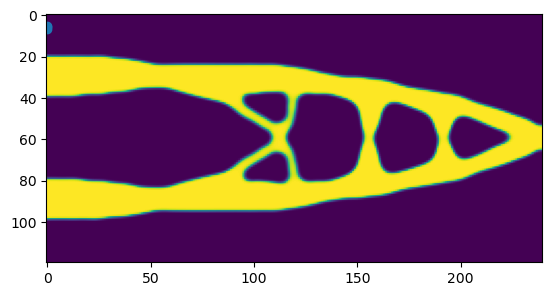

In [10]:
# print(design_vectors[0,:-1].reshape(120,240))
# design_vectors[design_vectors < 0.001] = 0
blf_matlab = []
blf_file = []
for n in range(10):
    plt.imshow(design_vectors[n][:-1].reshape(120,240))


    np.savetxt("test_matlab.csv", design_vectors[n][:-1].reshape(120,240), delimiter=',')
    octave.warning('off', 'Octave:possible-matlab-short-circuit-operator');

    calc_blf = octave.getblf("test_matlab", nout = 1)
    # another_blf = octave.getblf("data2000/csvfiles/1")

    print("Dataset: ", design_vectors[n][-1])
    print("Matlab: ", calc_blf)
    # print("Matlab but from csv ", another_blf)
    blf_matlab.append(calc_blf)
    blf_file.append(design_vectors[n][-1])
# Matlab:  0.0026568316587896484

plt.scatter(blf_matlab, blf_file)


Visualize distribution of the input dataset

[[0.00042431 0.00042698 0.0004278  ... 0.00016856 0.00016856 0.00016856]
 [0.00040298 0.00041322 0.00042187 ... 0.00016856 0.00016856 0.00016856]
 [0.0004246  0.00042756 0.00042961 ... 0.00016856 0.00016856 0.00016856]
 ...
 [0.00043173 0.00042218 0.00041347 ... 0.00016856 0.00016856 0.00016856]
 [0.00042257 0.00041311 0.00040489 ... 0.00016856 0.00016856 0.00016856]
 [0.00042599 0.00042779 0.00042952 ... 0.00016856 0.00016856 0.00016856]]


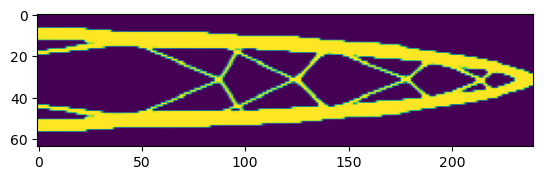

In [6]:
print(design_vectors[0,:-1].reshape(64,240))
design_vectors[design_vectors < 0.001] = 0
plt.imshow(design_vectors[0,:-1].reshape(64,240))



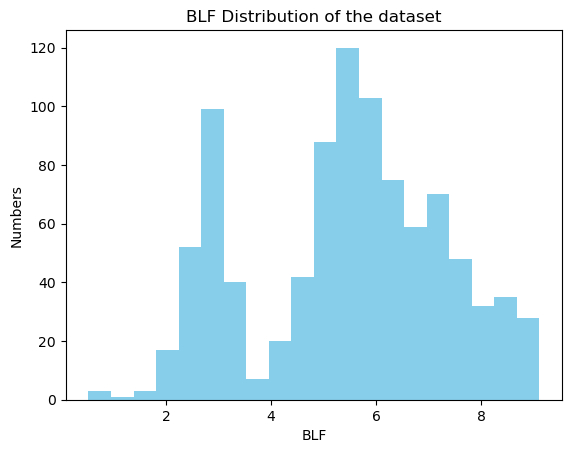

In [7]:
fig, ax = plt.subplots() 
plt.title('BLF Distribution of the dataset')
plt.hist(design_vectors[:,-1], bins = 20, color = 'skyblue')
ax.set_xlabel("BLF")
ax.set_ylabel("Numbers")
plt.savefig("Plots/BLF_distribution")
plt.show() 


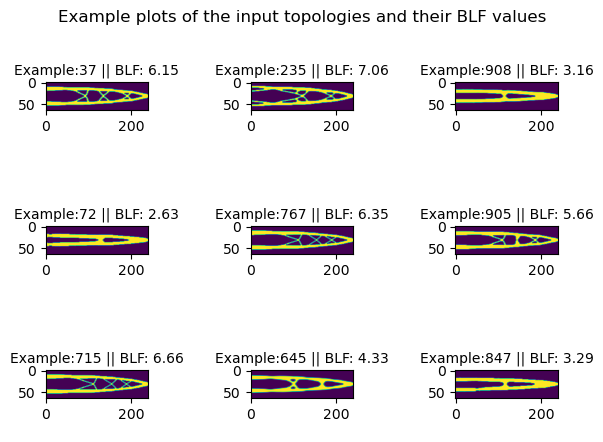

In [8]:
n = 3

fig = plt.figure()
plt.suptitle("Example plots of the input topologies and their BLF values")

plt.axis('off') 
plt.subplots_adjust(left=0.1,
                    bottom=0.1, 
                    right=0.9, 
                    top=0.9, 
                    wspace=1, 
                    hspace=0.5)

np.random.seed(seed=1) #for reproducibility
count = 0
for i in range(1,n+1):
    for j in range(1,n+1):
        count +=1 
        fig.add_subplot(n, n, count) 

        idx = np.random.randint(0, len(design_vectors))
        plt.imshow(design_vectors[idx,:-1].reshape(64,240))
        plt.title("Example:"+ str(idx)+ " || BLF: " + str(design_vectors[idx,-1])) 
        a=plt.gca()
        a.title.set_size(10)

np.random.seed(seed=None)
plt.savefig("Plots/Example_Plots_of_inputs")


In [78]:
from torch.utils.data import DataLoader

batch_size = 64
print("\nTotal datapoints")
print(len(design_vectors))

# Training 70%, validating 30%
training_set = design_vectors[:int(len(design_vectors)*0.7)]
validating_set = design_vectors[int(len(design_vectors)*0.7)+1:]


print("\nTraining Set shape")
print(training_set.shape)
print("\nValidation Images")
print(validating_set.shape)

# turn into tensors -> compatibal format for Dataloader.
training_set = torch.Tensor(training_set)
training_set = np.array(training_set)
training_dataloader = DataLoader(training_set, shuffle= True, batch_size = batch_size) # create your dataloader

validating_set = torch.Tensor(validating_set)
validating_set = np.array(validating_set)
validating_dataloader = DataLoader(validating_set, shuffle= True, batch_size = batch_size) # create your dataloader



Total datapoints
942

Training Set shape
(659, 15361)

Validation Images
(282, 15361)


In [10]:
print(training_set)

[[0.0000000e+00 0.0000000e+00 0.0000000e+00 ... 0.0000000e+00
  0.0000000e+00 8.6000004e+00]
 [0.0000000e+00 0.0000000e+00 0.0000000e+00 ... 0.0000000e+00
  0.0000000e+00 8.4399996e+00]
 [0.0000000e+00 0.0000000e+00 0.0000000e+00 ... 0.0000000e+00
  0.0000000e+00 7.8699999e+00]
 ...
 [1.1080302e-03 1.1080302e-03 1.1080302e-03 ... 1.1080302e-03
  1.1080302e-03 5.8000002e+00]
 [0.0000000e+00 0.0000000e+00 0.0000000e+00 ... 0.0000000e+00
  0.0000000e+00 5.3800001e+00]
 [0.0000000e+00 0.0000000e+00 0.0000000e+00 ... 0.0000000e+00
  0.0000000e+00 4.1399999e+00]]


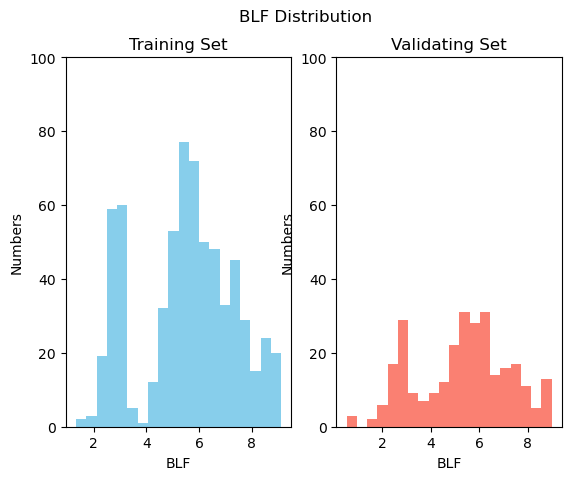

In [29]:
# histrogram of the distribution of the training and the validating sets
fig = plt.figure()
plt.suptitle("BLF Distribution")

fig.add_subplot(1, 2, 1) 
plt.title('Training Set')
plt.hist(training_set[:,-1], bins = 20, color = 'skyblue')
a=plt.gca()
a.set_xlabel("BLF")
a.set_ylabel("Numbers")
a.set_ylim([0, 100])

fig.add_subplot(1,2,2)
plt.title('Validating Set')
plt.hist(validating_set[:,-1], bins = 20, color = 'salmon')
a=plt.gca()
a.set_xlabel("BLF")
a.set_ylabel("Numbers")
a.set_ylim([0, 100])


plt.savefig("Plots/BLF_distribution_for_Training_Validating_sets")

## 2. Define VAE



In [30]:
class AutoEncoder(torch.nn.Module):
    def __init__(self, encoder, decoder):
        super(AutoEncoder, self).__init__()
        self.encoder = encoder
        self.decoder = decoder

        # can use other losses too, MAE, etc.
        self.loss = torch.nn.MSELoss() 

    def forward(self, x):
        encoded = self.encoder(x)
        decoded = self.decoder(encoded)
        return decoded

    def reconstruction_loss(self, input_image, target_image):
        return self.loss(input_image, target_image) 
    

Encoder Part

In [13]:
class Encoder(torch.nn.Module):
  #we are dealing with images -> use convolutional network.
    def __init__(self, latent_dimensionality=2):
        super(Encoder, self).__init__()
        input_size_flatten = (64*240 + 1)

        self.fc_1 = torch.nn.Linear(in_features= input_size_flatten, out_features=1000)
        self.fc_2 = torch.nn.Linear(in_features= 1000, out_features=100)

        #add blf to it, so the size become 100 + 1 
        self.fc_3 = torch.nn.Linear(in_features= 100 + 1 , out_features=latent_dimensionality)
    
    def forward(self, x):
        #pull blf values out (for skip connection)
        blf = torch.unsqueeze(x[...,-1],1)

        x = self.fc_1(x)
        x = F.relu(x)
        x = self.fc_2(x)
        x = F.relu(x)

        #We add blf again here
        x = torch.cat([x,blf], dim=-1)
        x = self.fc_3(x)
        return x
    
# the decoder essentially mirrors the architecture of the encoder
class Decoder(torch.nn.Module):
    def __init__(self, latent_dimensionality=2):
        super(Decoder, self).__init__()

        self.fc_1 = torch.nn.Linear(in_features=latent_dimensionality, out_features=100)
        self.fc_2 = torch.nn.Linear(in_features=100, out_features = 1000)
        self.fc_3 = torch.nn.Linear(in_features=1000, out_features = 64*240 + 1)

    
    def forward(self, x):
        
        x = self.fc_1(x)
        x = F.relu(x)
        x = self.fc_2(x)
        x = F.relu(x)
        x = self.fc_3(x)
      
        x1 = torch.sigmoid(x[...,:-1])  # squeeze pixel value between 0 and 1
        x2 = torch.unsqueeze(x[...,-1],1)

        x = torch.cat([x1,x2], dim =-1)
        return x

In [14]:
class VariationalAutoEncoder(AutoEncoder):
    def __init__(self, encoder, decoder, latent_dimensionality):
        super(VariationalAutoEncoder, self).__init__(encoder, decoder)

        self.latent_dimensionality = latent_dimensionality

    def forward(self, x):
        x = self.encoder(x)

        mu = x[:, : self.latent_dimensionality]
        log_variance = x[:, self.latent_dimensionality :]
        # sample from gaussian dis
        # project to log sigma^2 so we dont get negative values.
        variance = torch.exp(log_variance)
        eps = torch.randn_like(variance) #sample from a normal distribution
        sample = mu + torch.sqrt(variance) * eps #randomly scale, close to mu but not mu.
        x = self.decoder(sample)
        return x, mu, log_variance 

    def kullback_leibler_divergence(self, mu, log_variance):
        return 0.5 * torch.mean(mu ** 2 + torch.exp(log_variance) - (1 + log_variance))

In [15]:
device = "cuda" if torch.cuda.is_available() else "cpu"

In [21]:
vae_model = VariationalAutoEncoder(
    Encoder(latent_dimensionality= 4),
    Decoder(latent_dimensionality= 2),
    latent_dimensionality= 2,
).to(device)

In [22]:
optimizer = torch.optim.Adam(vae_model.parameters(), lr=0.001)

(tensor([[0.4584, 0.5364, 0.4860,  ..., 0.4889, 0.4678, 0.0316],
        [0.4792, 0.5008, 0.4945,  ..., 0.5184, 0.4899, 0.1232],
        [0.4632, 0.4966, 0.5209,  ..., 0.5499, 0.5107, 0.3345],
        ...,
        [0.4865, 0.5257, 0.4875,  ..., 0.5000, 0.4859, 0.0516],
        [0.4604, 0.5281, 0.4815,  ..., 0.4920, 0.4582, 0.0553],
        [0.4578, 0.5123, 0.5004,  ..., 0.5401, 0.4668, 0.0694]],
       device='cuda:0', grad_fn=<CatBackward0>), tensor([[-0.0245,  0.0700],
        [-0.0318,  0.0323],
        [-0.0369,  0.0521],
        [-0.0137,  0.0498],
        [-0.0442, -0.0092],
        [-0.0524,  0.0279],
        [-0.0072,  0.0069],
        [-0.0529,  0.0716],
        [-0.0533,  0.0406],
        [-0.0749,  0.0604],
        [-0.0080,  0.0722],
        [-0.0433,  0.0228],
        [-0.0203,  0.0214],
        [-0.0078, -0.0008],
        [-0.0136,  0.0178],
        [-0.0441,  0.0746],
        [-0.0458,  0.0480],
        [ 0.0084,  0.0162],
        [-0.0597,  0.0689],
        [-0.0365,  0

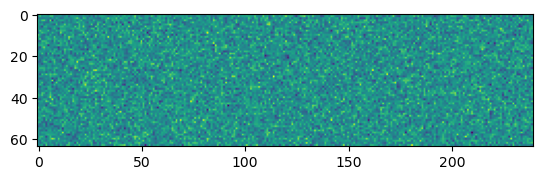

In [23]:
input_tensor = torch.rand(64, 64*240 + 1).to(device)

# Call the autoencoder
output = vae_model(input_tensor)
print(output)
# print(output.size())
imgplot = plt.imshow(output[0][0,:-1].reshape(64,240).detach().cpu().numpy())

In [24]:
training_losses = []
validating_losses = []

In [25]:
n_epochs = 1000
reporting_frequency = 200

for i in tqdm(range(1, n_epochs + 1)):

    # training
    for j, (vector_input) in enumerate(training_dataloader):
        optimizer.zero_grad()
        vector_input = vector_input.to(device)
        reconstructed, mu, log_variance = vae_model(vector_input)
        reconstruction_loss = vae_model.reconstruction_loss(reconstructed, vector_input)
        # print(reconstruction_loss)
        kl_divergence_loss = vae_model.kullback_leibler_divergence(mu, log_variance)
        # print(kl_divergence_loss)
        #loss has 2 terms -> reconstruction loss and kl_divergence_loss
        #scale 0.01 so it't not too big/small so it includes the kl_divergence, but not too much that interrupt the workflow.
        loss = reconstruction_loss + 0.01 * kl_divergence_loss
        # print(loss)

        loss.backward()
        optimizer.step()
        # print(loss)
        training_losses.append(loss.detach().cpu().numpy())
        if (j + 1) % reporting_frequency == 0:
            print(
                "Epoch {0} | Mean training loss after {1} batches: {2:.3f}".format(
                    i, j + 1, np.mean(training_losses)
                )
            )

    # validating
    for j, (vector_input) in enumerate(validating_dataloader):
        vector_input = vector_input.to(device)
        reconstructed, _, _ = vae_model(vector_input)
        print(reconstructed)
        loss = vae_model.reconstruction_loss(reconstructed, vector_input)
        # print(loss)
        validating_losses.append(loss.detach().cpu().numpy())

    print(
        "Epoch {0} | Mean training total loss: {1:.3f} | Mean validating reconstruction loss: {2:.3f}".format(
            i, np.mean(training_losses), np.mean(validating_losses)
        )
    )

  0%|          | 0/1000 [00:00<?, ?it/s]

tensor([[0.0208, 0.0344, 0.0374,  ..., 0.0579, 0.0230, 4.0930],
        [0.0659, 0.0839, 0.0968,  ..., 0.1167, 0.0790, 3.1620],
        [0.0642, 0.0826, 0.0946,  ..., 0.1145, 0.0770, 3.1926],
        ...,
        [0.0572, 0.0838, 0.0852,  ..., 0.1021, 0.0604, 2.8442],
        [0.0301, 0.0459, 0.0508,  ..., 0.0735, 0.0368, 3.9620],
        [0.0760, 0.1038, 0.1076,  ..., 0.1321, 0.0807, 2.7004]],
       device='cuda:0', grad_fn=<CatBackward0>)
tensor([[0.0289, 0.0447, 0.0483,  ..., 0.0718, 0.0323, 3.8438],
        [0.0382, 0.0564, 0.0617,  ..., 0.0856, 0.0457, 3.6578],
        [0.1061, 0.1354, 0.1400,  ..., 0.1590, 0.1178, 2.4386],
        ...,
        [0.0132, 0.0208, 0.0248,  ..., 0.0394, 0.0168, 5.1431],
        [0.0323, 0.0493, 0.0532,  ..., 0.0774, 0.0355, 3.6862],
        [0.0110, 0.0194, 0.0216,  ..., 0.0379, 0.0127, 4.9126]],
       device='cuda:0', grad_fn=<CatBackward0>)
tensor([[0.0319, 0.0465, 0.0528,  ..., 0.0732, 0.0394, 4.0274],
        [0.0538, 0.0827, 0.0808,  ..., 0.086

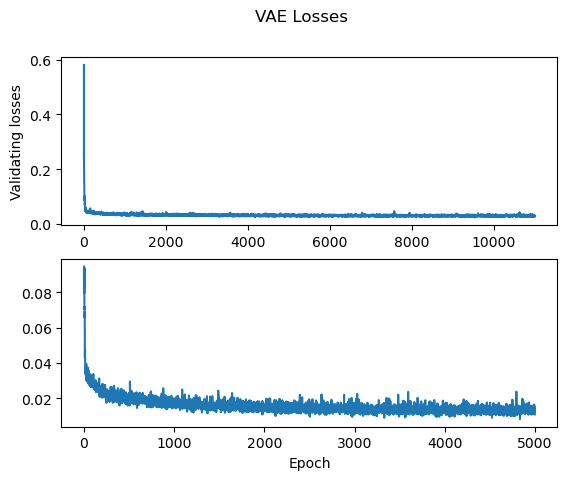

In [34]:
#plot losses
fig, (ax1, ax2) = plt.subplots(2, 1)
fig.suptitle('VAE Losses')

ax1.set_ylabel('Training losses')
p1 = ax1.plot(training_losses)

ax2.set_xlabel("Epoch")
ax1.set_ylabel('Validating losses')
p2 = ax2.plot(validating_losses)

plt.show

plt.savefig("Plots/VAE_losses")



In [35]:
vae_model.eval() #put this to inference mode.

VariationalAutoEncoder(
  (encoder): Encoder(
    (fc_1): Linear(in_features=15361, out_features=1000, bias=True)
    (fc_2): Linear(in_features=1000, out_features=100, bias=True)
    (fc_3): Linear(in_features=101, out_features=4, bias=True)
  )
  (decoder): Decoder(
    (fc_1): Linear(in_features=2, out_features=100, bias=True)
    (fc_2): Linear(in_features=100, out_features=1000, bias=True)
    (fc_3): Linear(in_features=1000, out_features=15361, bias=True)
  )
  (loss): MSELoss()
)

1
tensor([[4.6347e-04, 4.7738e-04, 4.5818e-04,  ..., 5.1827e-04, 4.5893e-04,
         6.4106e+00]], device='cuda:0', grad_fn=<CatBackward0>)
1
tensor([[2.0181e-03, 2.1726e-03, 2.2362e-03,  ..., 2.2552e-03, 2.0694e-03,
         4.9140e+00]], device='cuda:0', grad_fn=<CatBackward0>)
1
tensor([[9.3760e-04, 8.9212e-04, 9.2293e-04,  ..., 1.0021e-03, 8.9487e-04,
         6.2929e+00]], device='cuda:0', grad_fn=<CatBackward0>)


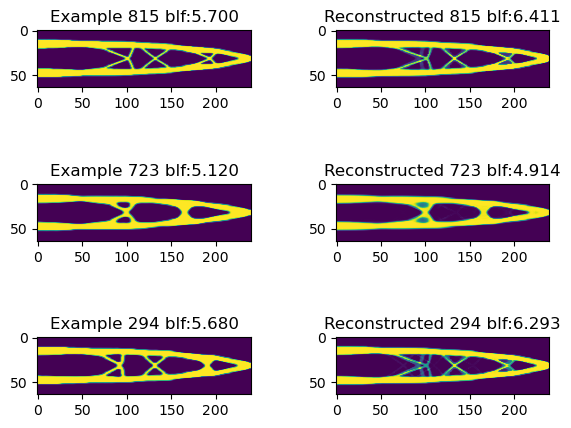

In [96]:
n = 3

fig = plt.figure()
plt.axis('off') 
plt.subplots_adjust(left=0.1,
                    bottom=0.1, 
                    right=0.9, 
                    top=0.9, 
                    wspace=0.4, 
                    hspace=1)

np.random.seed(seed=1234) #for reproducibility
for i in range(1,n+1):
    fig.add_subplot(n, 2, 2*i-1) 
    idx = np.random.randint(0, len(design_vectors))

    
    design_vector = design_vectors[idx,:]
    image_vector = design_vector[:-1]
    blf_val = design_vector[-1]

    plt.imshow(image_vector.reshape(64,240))
    # plt.title("Example:"+ str(idx) + " blf:" +str(blf_val)) 
    plt.title("Example {0} blf:{1:.3f}".format(idx, blf_val)) 
    fig.add_subplot(n, 2, 2*i) 

    reconstructed_vector,_,_ = vae_model(torch.tensor(design_vector.astype(np.float32)).to(device).unsqueeze(0))
    print(len(reconstructed_vector))
    print(reconstructed_vector)
    reconstructed_image = reconstructed_vector[0,:-1].detach().reshape(64,240).cpu()
    reconstructed_blf = reconstructed_vector[0,-1].detach().cpu().numpy()


    plt.imshow(reconstructed_image)
    #  "Epoch {0} | Mean training loss: {1:.3f} | Mean validating loss: {2:.3f}".format(
    #         i, np.mean(training_losses), np.mean(validating_losses)
    #     )
    plt.title("Reconstructed {0} blf:{1:.3f}".format(idx, reconstructed_blf)) 


np.random.seed(seed=None)

plt.savefig("Plots/Reconsturcted_topology")

# Check Predicted vs Actual BLF values

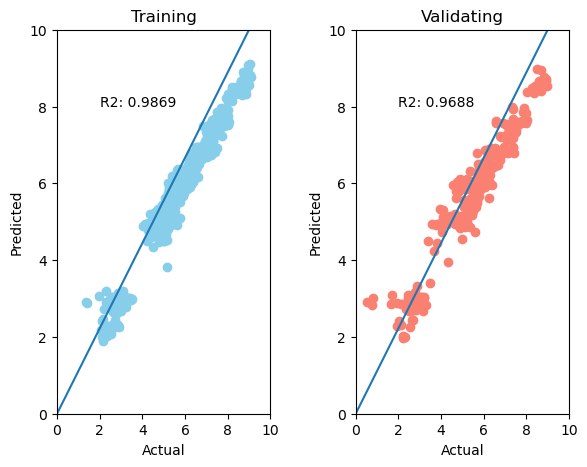

In [80]:
fig = plt.figure()
fig.add_subplot(1,2,1)
plt.title("Training")
plt.subplots_adjust(left=0.1,
                    bottom=0.1, 
                    right=0.9, 
                    top=0.9, 
                    wspace=0.4, 
                    hspace=1)
a = plt.gca()
a.set_xlabel("Actual")
a.set_ylabel('Predicted')
a.set_xlim([0, 10])
a.set_ylim([0, 10])
plt.plot(np.linspace(0,10,10))

training_reconstructed_blf_array = []
for i in range(len(training_set)):
# for i in range(1):    
    design_vector = training_set[i,:]

    image_vector = design_vector[:-1]
    blf_val = design_vector[-1]

    reconstructed_vector, mu, log_variance= vae_model(torch.tensor(design_vector.astype(np.float32)).to(device).unsqueeze(0))

    reconstructed_blf = reconstructed_vector[0,-1].detach().cpu().numpy()
    plt.scatter(blf_val, reconstructed_blf, c = 'skyblue')
    training_reconstructed_blf_array.append(reconstructed_blf)

slope, intercept, r_value1, p_value, std_err = scipy.stats.linregress(training_set[:,-1], training_reconstructed_blf_array)
plt.text(2,8, "R2: {x:.4f}".format(x = r_value1))

fig.add_subplot(1,2,2)
plt.plot(np.linspace(0,10,10))
plt.title("Validating")
a = plt.gca()
a.set_xlabel("Actual")
a.set_ylabel('Predicted')
a.set_xlim([0, 10])
a.set_ylim([0, 10])
###########################################
validating_reconstructed_blf_array = []
for i in range(len(validating_set)):
# for i in range(1):    
    design_vector = validating_set[i,:]

    image_vector = design_vector[:-1]
    blf_val = design_vector[-1]

    reconstructed_vector, mu, log_variance= vae_model(torch.tensor(design_vector.astype(np.float32)).to(device).unsqueeze(0))

    reconstructed_blf = reconstructed_vector[0,-1].detach().cpu().numpy()
    plt.scatter(blf_val, reconstructed_blf, c = 'salmon')
    validating_reconstructed_blf_array.append(reconstructed_blf)

slope, intercept, r_value2, p_value, std_err = scipy.stats.linregress(validating_set[:,-1], validating_reconstructed_blf_array)
plt.text(2,8, "R2: {x:.4f}".format(x = r_value2))

plt.savefig("Plots/Predict_vs_Actual_plot")

Get all of the encodings + plot them into a space

In [90]:
def get_all_encodings(model, dataloader):
    all_encoded = []
    all_blf = []
    for _ , input_vector in enumerate(dataloader):
        encoding = model.encoder(input_vector.to(device)).detach().cpu().numpy()
        all_encoded.append(encoding)
        # print(input_vector.shape)
        all_blf.append(input_vector[:,-1])
        #all_labels.append(labels.numpy())

    all_encoded = np.concatenate(all_encoded)
    all_blf = np.concatenate(all_blf)

    return all_encoded , all_blf


def plot_topopt_encoding(model):
    fig, ax = plt.subplots(1, 2, figsize=(10, 5))

    # Training data
    ax[0].set_title(label="Encoding of Topology training set")
    all_encoded_train, all_blf_train = get_all_encodings(model, training_dataloader)
    training_bbox = np.min(all_encoded_train, axis=0), np.max(all_encoded_train, axis=0)

    scatter1 = ax[0].scatter(
        all_encoded_train[:, 0],
        all_encoded_train[:, 1],
        c=all_blf_train,
        alpha=0.2,
        cmap="plasma",
        label="Training",
    )
    # plt.colorbar(scatter1)

    # Validation data
    ax[1].set_title(label="Encoding of Topology validating set")
    all_encoded, all_blf = get_all_encodings(model, validating_dataloader)
    validating_bbox = np.min(all_encoded, axis=0), np.max(all_encoded, axis=0)

    scatter2 = ax[1].scatter(
        all_encoded[:, 0],
        all_encoded[:, 1],
        c=all_blf,
        alpha=0.5,
        marker="+",
        cmap="plasma",
    )
    # plt.colorbar(scatter2)
    cbar = fig.colorbar(scatter2, ax=ax.ravel().tolist(), shrink=0.95)

    # ax[1].legend(*scatter.legend_elements(), title="blf", bbox_to_anchor=(1, 0.5))

    # adjust such that both subplots have same bounds
    ax[0].set_xlim(
        min(training_bbox[0][0], validating_bbox[0][0]),
        max(training_bbox[1][0], validating_bbox[1][0]),
    )
    ax[1].set_xlim(
        min(training_bbox[0][0], validating_bbox[0][0]),
        max(training_bbox[1][0], validating_bbox[1][0]),
    )

    ax[0].set_ylim(
        min(training_bbox[0][1], validating_bbox[0][1]),
        max(training_bbox[1][1], validating_bbox[1][1]),
    )
    ax[1].set_ylim(
        min(training_bbox[0][1], validating_bbox[0][1]),
        max(training_bbox[1][1], validating_bbox[1][1]),
    )


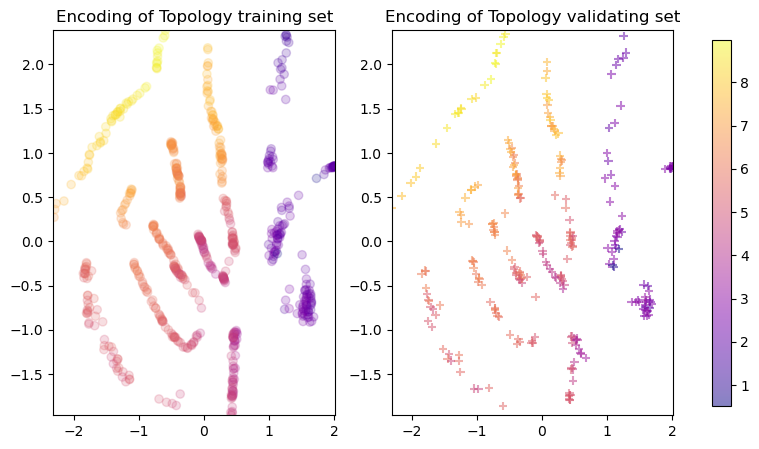

In [91]:
plot_topopt_encoding(vae_model)
plt.savefig("Plots/Encoding_plot")

For saving the weights to be used later.

In [95]:
saved_file_name = "vae1205.pth"  
torch.save(vae_model.state_dict(), saved_file_name)

# Load model parameters
reloaded_vae_model = VariationalAutoEncoder(
    Encoder(latent_dimensionality=4),
    Decoder(latent_dimensionality=2),
    latent_dimensionality=2).to(device)

reloaded_vae_model.load_state_dict(torch.load(saved_file_name))
reloaded_vae_model.eval()

TypeError: super(type, obj): obj must be an instance or subtype of type

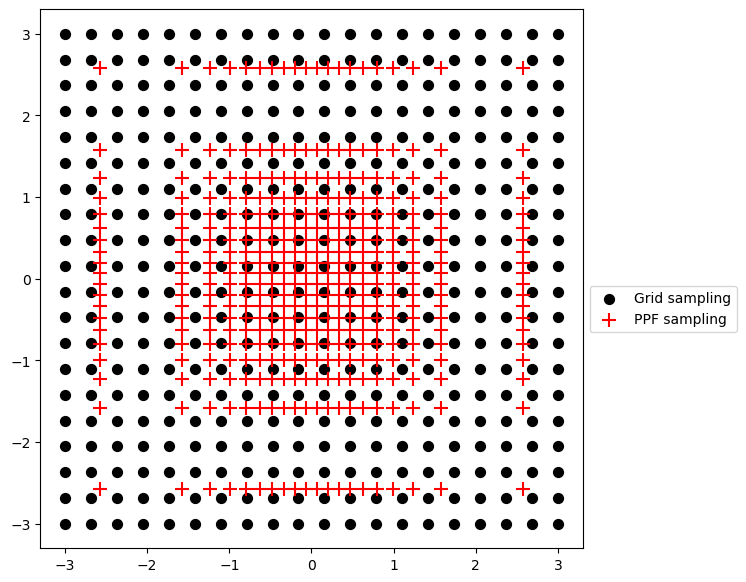

In [ ]:
# plt.figure(figsize=(7, 7))

# n = 20  # sampling resolution
# # evenly-spaced grid sampling in latent space
# z = np.linspace(-3, 3, n)
# Z1, Z2 = np.meshgrid(z, z)
# Z = np.vstack([Z1.flatten(), Z2.flatten()]).T

# plt.scatter(Z[:, 0], Z[:, 1], s=50, c="black", label="Grid sampling")

# z = scipy.stats.norm.ppf(np.linspace(0.005, 0.995, n))
# Z1, Z2 = np.meshgrid(z, z)
# Z = np.vstack([Z1.flatten(), Z2.flatten()]).T

# plt.scatter(Z[:, 0], Z[:, 1], marker="+", s=100, c="red", label="PPF sampling")
# plt.legend(fontsize=10, bbox_to_anchor=(1, 0.5))
# plt.show()

Sample VAE on the described scheme

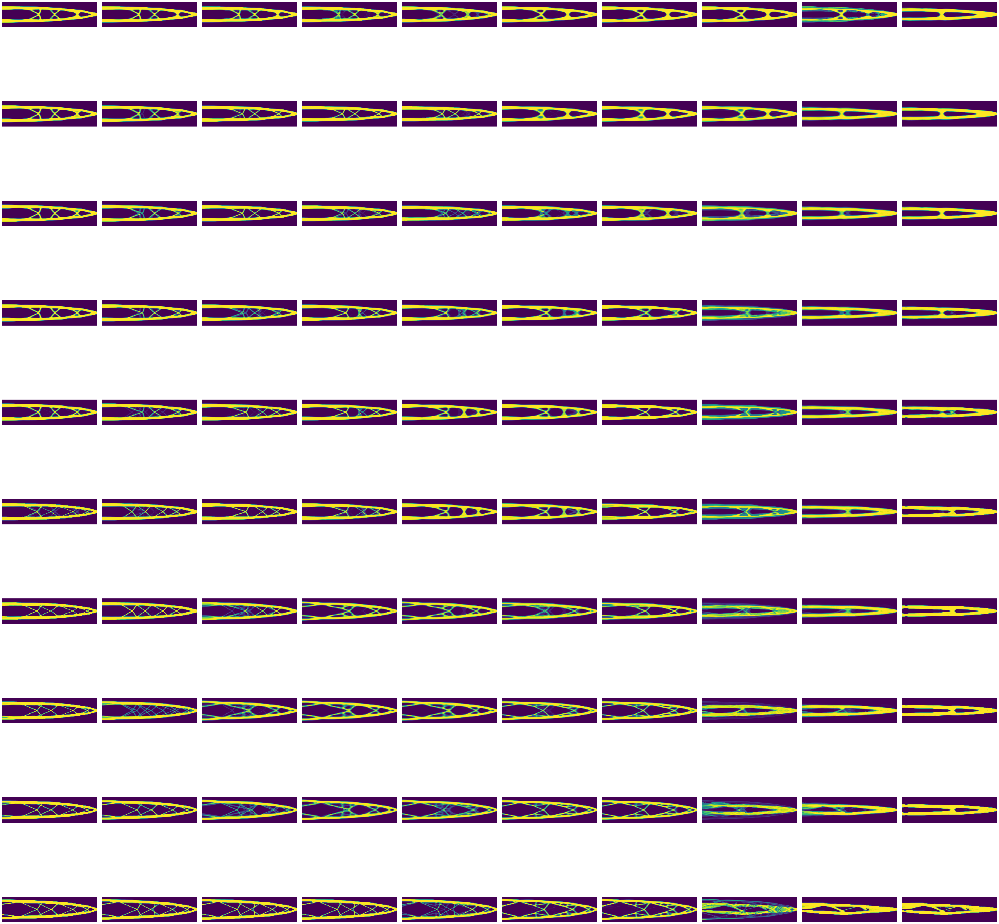

In [121]:
n = 10  # number of images per rows columns

# grid sampling in latent space
z = scipy.stats.norm.ppf(np.linspace(0.005, 0.995, n))
Z1, Z2 = np.meshgrid(z, z)
Z = np.vstack([Z1.flatten(), Z2.flatten()]).T

# decode samples
ims = vae_model.decoder(torch.tensor(Z).float().to(device)).detach().cpu()

fig, axes = plt.subplots(n, n, figsize=(70, 70))
fig.subplots_adjust(hspace=0.05, wspace=0.05)
small_reconstructed_blf_array = ims[:,-1]
count = 0
for k in range(0, ims.shape[0]):
    i, j = int(count / n), int(count % n)
    axes[i, j].imshow(ims[k,:-1].reshape(64,240))
    axes[i, j].axis("off")
    count += 1
# plt.savefig("Plots/Plots_topology_GaussSpace")
plt.show()

In [ ]:
fig, ax = plt.subplots(1, 2, figsize=(10, 5))
# Training data
ax[0].set_title(label="Encoding of Topology BLF from the latent space")

training_bbox = np.min(Z, axis=0), np.max(Z, axis=0)

scatter1 = ax[0].scatter(
    Z[:, 0],
    Z[:, 1],
    c= blf_array_reconstructed,
    alpha=0.2,
    cmap="plasma",
    label="Training",
)
plt.colorbar(scatter1)

# # MATLAB calc data.

ax[1].set_title(label="Encoding of Topology BLF calc from Matlab")


# scatter2 = ax[1].scatter(
#     Z[:, 0],
#     Z[:, 1],
#     c=blf_array_matlab,
#     alpha=0.5,
#     marker="+",
#     cmap="plasma",
# )
# plt.colorbar(scatter2)

# ax[1].legend(*scatter.legend_elements(), title="blf", bbox_to_anchor=(1, 0.5))

# adjust such that both subplots have same bounds
ax[0].set_xlim(
    training_bbox[0][0]-0.5,
    training_bbox[1][0]+0.5,
)

ax[0].set_ylim(
    training_bbox[0][1]-0.5,
    training_bbox[1][1]+0.5
)

# ax[1].set_xlim(
#     training_bbox[0][0]-0.5,
#     training_bbox[1][0]+0.5,
# )

# ax[1].set_ylim(
#     training_bbox[0][1]-0.5,
#     training_bbox[1][1]+0.5
# )



In [155]:
n = 50
# number of images per rows columns

z = scipy.stats.norm.ppf(np.linspace(0.005, 0.995, n))
Z1, Z2 = np.meshgrid(z, z)
Z = np.vstack([Z1.flatten(), Z2.flatten()]).T
 
# decode samples
ims = vae_model.decoder(torch.tensor(Z).float().to(device)).detach().cpu()

# plot
fig, axes = plt.subplots(n, n, figsize=(35, 35))
fig.subplots_adjust(hspace=0.05, wspace=0.05)

structure_array = []
blf_array_matlab = np.zeros((n,n))
blf_array_reconstructed = np.zeros((n,n))
count = 0

for k in tqdm(range(0, ims.shape[0])):
    print(k)
    i, j = int(count / n), int(count % n)
    ims_array = ims[k, :-1].reshape(64,240)
    axes[i, j].imshow(ims_array)
    axes[i, j].axis("off")

    structure_array.append(ims[k,:-1])
    reconstructed_blf = ims[k,-1]
    blf_array_reconstructed[i,j] = reconstructed_blf
    filename = "data/" + str(k)
    # np.savetxt( filename +'.csv', ims_array, delimiter=',')
    # blf_array_matlab[i,j] = octave.getblf(filename, nout = 1)
    
    # print(i,j,blf_array[i,j])
    count += 1
plt.show()
# print(blf_array)
# np.savetxt( "blf_arrays" +'.csv', blf_array, delimiter=',')




<IPython.core.display.Javascript object>

  0%|          | 0/2500 [00:00<?, ?it/s]

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127
128
129
130
131
132
133
134
135
136
137
138
139
140
141
142
143
144
145
146
147
148
149
150
151
152
153
154
155
156
157
158
159
160
161
162
163
164
165
166
167
168
169
170
171
172
173
174
175
176
177
178
179
180
181
182
183
184
185
186
187
188
189
190
191
192
193
194
195
196
197
198
199
200
201
202
203
204
205
206
207
208
209
210
211
212
213
214
215
216
217
218
219
220
221
222
223
224
225
226
227
228
229
230
231
232
233
234
235
236
237
238
239
240
241
242
243
244
245
246
247
248
249
250
251
252
253
254
255
256
257
258
259
260
261
262
263
264
265
266
267
268
269
270
271
272
273
274
275
276
27

(-3.075829303548901, 3.0758293035489004)

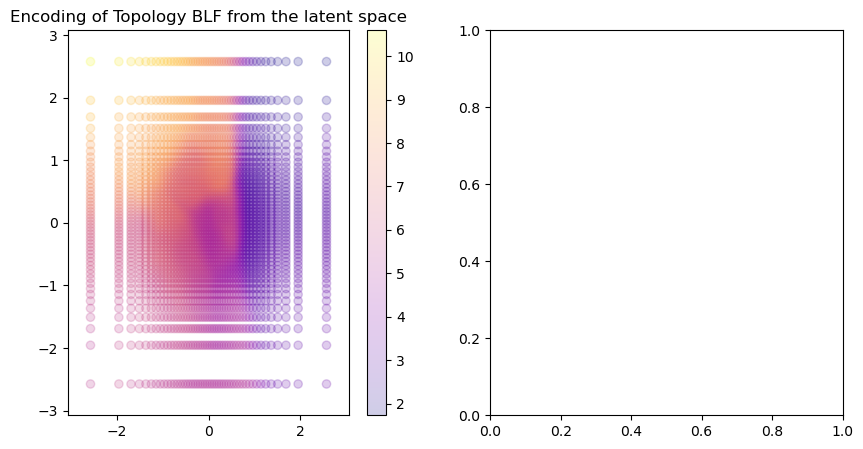

In [158]:
fig, ax = plt.subplots(1, 2, figsize=(10, 5))
# Training data
ax[0].set_title(label="Encoding of Topology BLF from the latent space")

training_bbox = np.min(Z, axis=0), np.max(Z, axis=0)

scatter1 = ax[0].scatter(
    Z[:, 0],
    Z[:, 1],
    c= blf_array_reconstructed,
    alpha=0.2,
    cmap="plasma",
    label="Training",
)
plt.colorbar(scatter1)

# # MATLAB calc data.

# ax[1].set_title(label="Encoding of Topology BLF calc from Matlab")


# scatter2 = ax[1].scatter(
#     Z[:, 0],
#     Z[:, 1],
#     c=blf_array_matlab,
#     alpha=0.5,
#     marker="+",
#     cmap="plasma",
# )
# plt.colorbar(scatter2)

# ax[1].legend(*scatter.legend_elements(), title="blf", bbox_to_anchor=(1, 0.5))

# adjust such that both subplots have same bounds
ax[0].set_xlim(
    training_bbox[0][0]-0.5,
    training_bbox[1][0]+0.5,
)

ax[0].set_ylim(
    training_bbox[0][1]-0.5,
    training_bbox[1][1]+0.5
)

# ax[1].set_xlim(
#     training_bbox[0][0]-0.5,
#     training_bbox[1][0]+0.5,
# )

# ax[1].set_ylim(
#     training_bbox[0][1]-0.5,
#     training_bbox[1][1]+0.5
# )



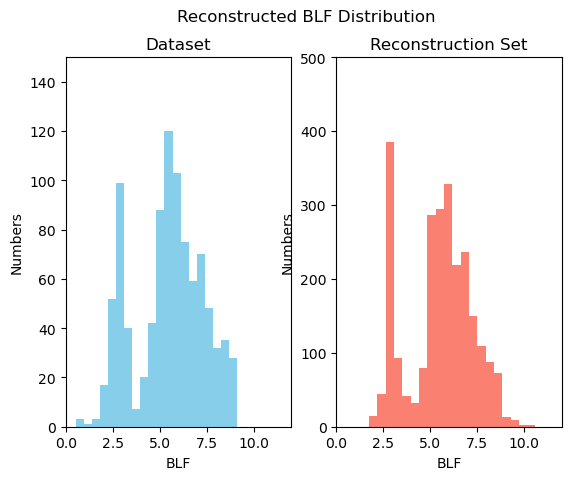

In [208]:
# histrogram of the distribution of the training and the validating sets
fig = plt.figure()
plt.suptitle("Reconstructed BLF Distribution")

fig.add_subplot(1, 2, 1) 
plt.title('Dataset')
plt.hist(design_vectors[:,-1], bins = 20, color = 'skyblue')
a=plt.gca()
a.set_xlabel("BLF")
a.set_ylabel("Numbers")
a.set_ylim([0, 150])
a.set_xlim([0, 12])
fig.add_subplot(1,2,2)
plt.title('Reconstruction Set')
plt.hist(blf_array_reconstructed.flatten(), bins = 20, color = 'salmon')
a=plt.gca()
a.set_xlabel("BLF")
a.set_ylabel("Numbers")
a.set_ylim([0, 500])
a.set_xlim([0, 12])


plt.savefig("Plots/BLF_distribution_for_Training_Validating_sets")

Plot high performance structures

There are 175 high performance structures


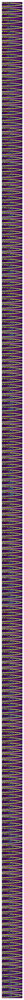

In [207]:
blf_flatten = blf_array_reconstructed.flatten()
good = np.array(structure_array)[blf_flatten > 8]
n_good = np.shape(good)[0]
print("There are " + str(np.shape(good)[0]) + " high performance structures")

fig, axes = plt.subplots(n_good,1,figsize=(35, 70))
fig.subplots_adjust(hspace=0.05, wspace=2)
count = 0
for i in range(n_good):
    ims = good[i]
    axes[i].imshow(ims.reshape(64,240))
    axes[i].text(10,20,'{0:.3f}'.format(blf_flatten[blf_flatten >8][i]))
    axes[i].axis("off")
    count += 1
# plt.savefig("Plots/Plots_topology_GaussSpace")
plt.show()

In [ ]:
np.savetxt( "1204blf_latent_arrays" +'.csv', blf_array_reconstructed, delimiter=',')
np.savetxt( "1204blf_matlab_arrays" +'.csv', blf_array_matlab, delimiter=',')


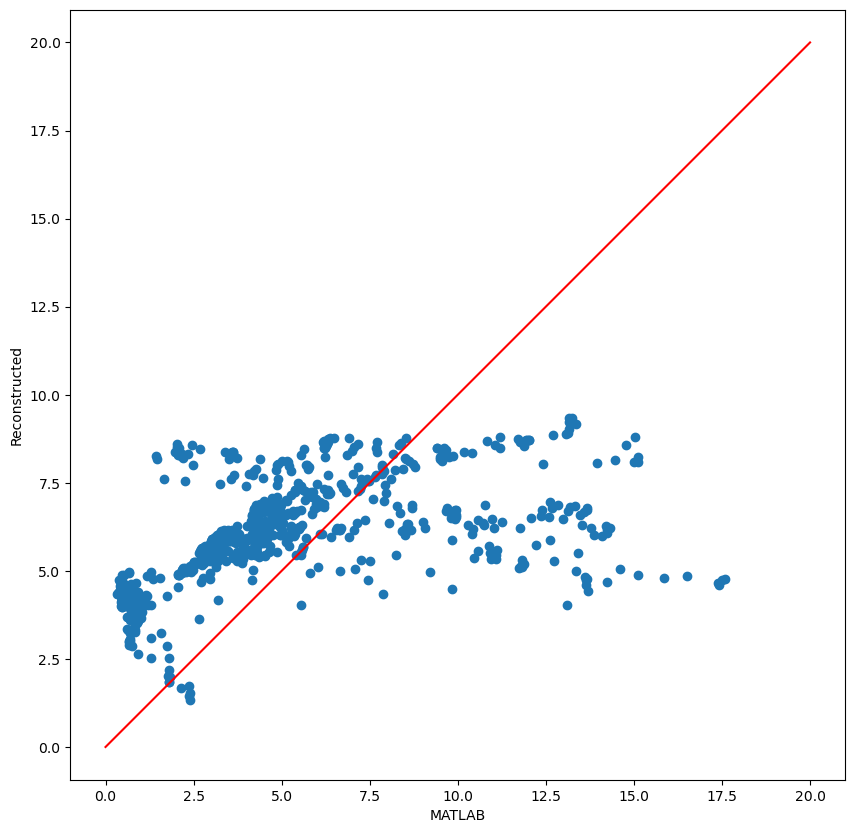

In [ ]:
fig2, ax2 = plt.subplots(1, 1, figsize=(10, 10))
ax2.axis('equal')
ax2.plot(np.linspace(0,20,20), np.linspace(0,20,20), c = 'r')
ax2.scatter(blf_array_matlab.flatten(), blf_array_reconstructed.flatten())
plt.xlabel("MATLAB")
plt.ylabel("Reconstructed")
plt.show()

(-3.075829303548901, 3.0758293035489004)

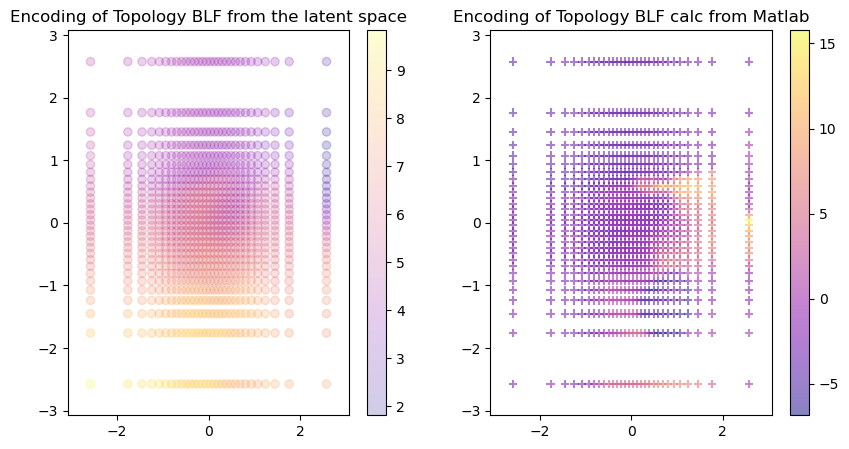

In [ ]:
fig, ax = plt.subplots(1, 2, figsize=(10, 5))
# Training data
ax[0].set_title(label="Encoding of Topology BLF from the latent space")

training_bbox = np.min(Z, axis=0), np.max(Z, axis=0)

scatter1 = ax[0].scatter(
    Z[:, 0],
    Z[:, 1],
    c= blf_array_reconstructed,
    alpha=0.2,
    cmap="plasma",
    label="Training",
)
plt.colorbar(scatter1)

# # MATLAB calc data.

ax[1].set_title(label="Encoding of Topology BLF calc from Matlab")


scatter2 = ax[1].scatter(
    Z[:, 0],
    Z[:, 1],
    c=blf_array_matlab-blf_array_reconstructed,
    alpha=0.5,
    marker="+",
    cmap="plasma",
)
plt.colorbar(scatter2)

# ax[1].legend(*scatter.legend_elements(), title="blf", bbox_to_anchor=(1, 0.5))

# adjust such that both subplots have same bounds
ax[0].set_xlim(
    training_bbox[0][0]-0.5,
    training_bbox[1][0]+0.5,
)

ax[0].set_ylim(
    training_bbox[0][1]-0.5,
    training_bbox[1][1]+0.5
)

ax[1].set_xlim(
    training_bbox[0][0]-0.5,
    training_bbox[1][0]+0.5,
)

ax[1].set_ylim(
    training_bbox[0][1]-0.5,
    training_bbox[1][1]+0.5
)


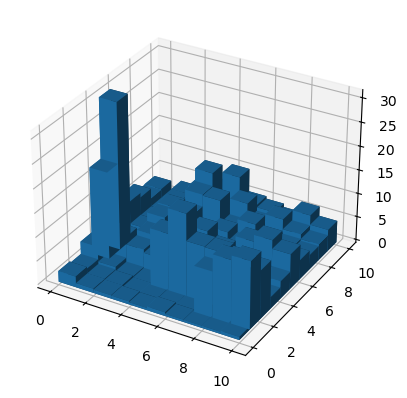

In [ ]:
from mpl_toolkits.mplot3d import axes3d
import matplotlib.pyplot as plt
import numpy as np

# np.random.seed(1234)
fig = plt.figure()
ax1 = fig.add_subplot(111, projection='3d')
# A = np.random.randint(5, size=(25, 10))
A = blf_array

x = np.array([[i] * n for i in range(n)]).ravel() # x coordinates of each bar
y = np.array([i for i in range(n)] * n) # y coordinates of each bar